# Eigenface Gesichtserkennung
* Autor: Prof. Dr. Johannes Maucher
* Datum: 27.11.2015

[Übersicht Ipython Notebooks im Data Mining Praktikum](Data Mining Praktikum.ipynb)

# Einführung
## Lernziele:

In diesem Versuch sollen Kenntnisse in folgenden Themen vermittelt werden:

* __Gesichtserkennung:__ mit der Eigenface Methode. 
* __Principal Component Analysis__
* __Bildverarbeitung__ mit Python.

Sämtliche Verfahren und Algorithmen werden in Python implementiert.

## Theorie zur Vorbereitung

Die Gesichtserkennung kann mit unterschiedlichen Ansätzen realisiert werden. In diesem Versuch wird ausschließlich der _Eigenface_-Ansatz vorgestellt. Dieser Ansatz basiert auf der _Principal Component Analysis (PCA)_ und wurde erstmals in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) vorgestellt. Die Eigenface-Methode weist eine gute Performance im Fall biometrisch aufgenommener Gesichtsbilder auf.

### Das Prinzip der Eigenface Gesichtserkennung

Bilder mit $C$ Pixeln in der Breite und $R$ Pixeln in der Höhe können als $R \times C$ Matrizen abgespeichert werden. Handelt es sich um ein Schwarz-Weiß- oder Graustufen-Bild, dann wird pro Bild nur eine derartige Matrix benötigt. Der Eintrag in der i.ten Zeile und j.ten Spalte dieser Matrix definiert den Grauwert des entsprechenden Pixels. In Farbbildern werden je nach benutztem Farbraum mehrere  Matrizen pro Bild benötigt, wobei jede Matrix einen Farbkanal des Bildes repräsentiert. Für ein RGB-Bild werden z.B. 3 Matrizen für die Farbkanäle Rot, Grün und Blau benötigt. \\

Im Folgenden wird von quadratischen Graubildern mit $N \times N$ Pixeln ausgegangen. Wird jedes Pixel als ein Merkmal betrachtet, dann existieren insgesamt $N^2$ Merkmale, das Bild kann auch als ein Punkt im $N^2$-dimensionalen Raum betrachtet werden. Bilder der Auflösung $256 \times 256$ müßten also im $65536$-dimensionalen Raum beschrieben werden. Entsprechend komplex wäre die notwendige Verarbeitung. Ist jedoch bekannt, dass in einer Menge von Bildern jeweils ein gleichartiges Objekt abgebildet ist, z.B. wenn alle Bilder ausschließlich je ein Gesicht enthalten, dann existieren große Abhängigkeiten zwischen diesen Bildern. Geometrisch ausgedrückt bedeutet dies, dass die Punkte, welche die Menge der gleichartigen Bilder beschreiben, nicht gleichmäßig über den $N^2$-dimensionalen Raum verteilt sind, sondern in einen relativ kleinen Unterraum mit $K<<N^2$ Dimensionen nahezu vollständig beschrieben werden können. Jede dieser $K$ Dimensionen beschreibt ein für die Kategorie (z.B. Gesichtsbilder) relevantes Merkmal. Im Fall der Gesichtserkennung werden die relevanten Merkmale auch als Eigenfaces bezeichnet. Jedes Eigenface kann als Bild dargestellt werden, welches ein bestimmtes Gesichtsmerkmal besonders hervorhebt. Jedes individuelle Bild der Kategorie (d.h. jedes Gesicht) kann dann als Linearkombination der $K$ relevanten Merkmale (der $K$ Eigenfaces) beschrieben werden.\\

Das Problem besteht nun zunächst darin, aus einer Menge von Bildern der gleichen Kategorie die relevanten Merkmale zu finden. Dieses Problem wird durch die Principal Component Analysis (PCA) gelöst. Die PCA, findet in einer Menge von Bildern der gleichen Kategorie die Hauptachsen, also die Richtungen im $N^2$-dimensionalen Raum, entlang derer die Varianz zwischen den gegebenen Bildern am stärksten ist. Der $N^2$-dimensionale Pixelraum wird dann in einen Raum, der durch die gefundenen Hauptachsen aufgespannt wird, transformiert. In diesem in der Anzahl der Dimensionen stark reduzierten Raum wird dann die Bilderkennung durchgeführt. Der hier skizzierte Ansatz der Eigenfaces für die Gesichtserkennung wurde erstmalig in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) beschrieben.

### Genereller Ablauf

Die Gesichtserkennung besteht aus 2 Phasen. In der Trainingsphase werden die Gesichtsbilder der zu erkennenden Personen eingelesen und für diese mit der PCA der Eigenface-Raum berechnet. In der Erkennungsphase wird ein neu aufgenommenes Bild in den Eigenface-Raum transformiert und dort dem naheliegendsten Bild aus der Trainingsmenge zugeordnet.

#### Trainingsphase

1. Lese Gesichtsbilder der Personen, die erkannt werden sollen ein. Die Menge dieser Bilder definiert das Trainingsset
2. Berechne mit der PCA den Eigenface-Raum. Dabei werden nur die K Dimensionen, welche zu den Eigenvektoren mit den größten Eigenwerten gehören ausgewählt. Die zu den K Dimensionen (Eigenvektoren) gehörenden Bilder sind die Eigenfaces.
3. Transformiere jedes Bild der Trainingsmenge in den Eigenface-Raum und erhalte so die entsprechende Repräsentation des Bildes als Punkt im Eigenface-Raum.

#### Erkennungsphase

1. Transformiere das zu erkennende Bild in den Eigenface-Raum und berechne dort die Koordinaten des Bildes hinsichtlich aller K-Dimensionen (Eigenfaces)
2. Bestimme ob das zu erkennende Bild überhaupt eine Gesicht darstellt
3. Bestimme ob das Gesicht zu einer bekannten Person, deren Bild in der Trainingsmenge enthalten ist, gehört.

#### Update (optional)

Füge das erkannte Bild zur Menge der Trainingsbilder hinzu und führe die Schritte der Trainingsphase durch.

### Bestimmung der Eigenfaces
<a id='theoryEig'></a>
Es werden zunächst $M$ Gesichtsbilder der zu erkennenden Personen eingelesen (von jeder zu erkennenden Personen möglichst mehrere Bilder). Es wird davon ausgegangen, dass jedes der Bilder $C$ Pixel breit und $R$ Pixel hoch ist. Das Bild kann dann als $R \times C$ Matrix dargestellt werden. Im Fall eines Graustufenbildes repräsentieren die Pixelwerte den entsprechenden Grauwert. Nach dem Einlesen werden die Bildmatrizen als eindimensionale Vektoren dargestellt. Für diese Umformung werden die Zeilen jeder Matrix von oben nach unten ausgelesen und hintereinander gereiht. Jedes Bild wird dann durch einen Vektor der Länge $Z=R \cdot C$ repräsentiert und kann als Punkt im Z-dimensionalen Raum dargestellt werden. Die M Bildvektoren werden im folgenden mit $$\Gamma _1, \Gamma_2, \ldots, \Gamma_M$$ bezeichnet.

Im nächsten Schritt wird das Durchschnittsbild berechnet
$$
\overline{\Gamma}=\frac{1}{M}\sum_{i=1}^{M}{\Gamma_{i}}
$$

Dieses Durchschnittsbild wird von allen Bildern $\Gamma_i$ abgezogen. Die Menge der so gewonnenen Bildrepräsentationen
$$
\Phi_i=\Gamma_i - \overline{\Gamma}
$$

ist dann mittelwertsfrei. Die Menge  $\Phi_1, \Phi_2, \ldots, \Phi_M$ wird dann einer Principal Component Analysis (PCA) (siehe auch [J. Maucher; Feature Selection and Extraction](https://docs.google.com/document/d/13cc9RGeIvsV5JsC-MsymJ6aaJs_ZsUKEwqaOOO8IL8Q/edit?usp=sharing)) unterzogen. Hierzu werden die mittelwertfreien Bildrepräsentationen $\Phi_i$ in die Spalten einer Matrix geschrieben. Diese Matrix wird im Folgenden mit $X$ bezeichnet. Unter der Annahme, dass die $\Phi_i$ bereits als Spaltenvektoren vorliegen, ist die Matrix $X$ definiert als:

$$
X=\left[ \Phi_1, \Phi_2, \ldots, \Phi_M \right].
$$

Die entsprechende Kovarianzmatrix ist dann
$$
CV=X \cdot X^T.
$$

Für die PCA müssten als nächstes eigentlich die Eigenvektoren und Eigenwerte der Kovarianzmatrix $CV$ berechnet werden. Für den vorliegenden Fall kann allerdings die hierfür notwendige Berechnung aus Komplexitätsgründen nicht realisiert werden. Man beachte dass die Matrix $CV$  $Z$ Spalten und $Z$ Zeilen enthält ($Z$ ist die Anzahl der Pixel in einem Bild) und für diese $Z$ Eigenvektoren und Eigenwerte existieren. Wie in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) beschrieben, existieren im Fall, dass die Anzahl der Bilder $M$ wesentlich kleiner als die Anzahl der Pixel $Z$ ist, nur $M-1$ __relevante Eigenvektoren__, die Eigenwerte aller anderen Eigenvektoren liegen nahe bei Null. Der in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) beschriebene Ansatz geht nun von der $M \times M$ Matrix

$$
X^T \cdot X
$$

aus, für welche die Eigenvektoren und Eigenwerte für eine moderate Bildanzahl $M$ gut berechnet werden können. Per Definition gilt für die Eigenvektoren $\mathbf{v}_i$ und Eigenwerte $\mu_i$ dieser Matrix:

$$
X^T \cdot X \cdot \mathbf{v}_i = \mu_i \mathbf{v}_i .
$$

Werden beide Seiten dieser Matrix linksseitig mit der Matrix $X$ multipliziert,

$$
X \cdot X^T \cdot X \cdot \mathbf{v}_i = \mu_i X \mathbf{v}_i,
$$
dann ist daraus zu erkennen, dass die $M$ Vektoren
$$
\mathbf{u}_i=X \mathbf{v}_i
$$

die Eigenvektoren der Matrix $$CV=X \cdot X^T$$ sind. D.h. es können zunächst die M Eigenvektoren der relativ kleinen Matrix $X^T \cdot X$ bestimmt und aus diesen durch eine einfache Multiplikation mit der Matrix $X$ die relevanten Eigenvektoren der Matrix $CV$ berechnet werden. Da die Matrix $X$ die $M$ Bildrepräsentationen  $\Phi_i$ als Spalten enthält, können die gesuchten Eigenvektoren auch als Linearkombination der $M$ Bilder der Trainingsmenge beschrieben werden:

$$
\mathbf{u}_i=\sum_{k=1}^{M}{v_{i,k}\Phi_k}
$$

wobei mit $v_{i,k}$ die $k.$te Komponente des Vektors $\mathbf{v}_i$ bezeichnet wird. Die Eigenvektoren $\mathbf{u}_i$ werden auch Eigenfaces genannt. Per Definition sind die Eigenvektoren paarweise orthogonal. Jeder Eigenvektor ist ein Spaltenvektor mit $Z$ (=Anzahl der Pixel) Komponenten.

Die $M$ Eigenvektoren werden dann entsprechend der Größe der zugehörigen Eigenwerte $\mu_i$ geordnet. Für die weiteren Schritte kann zum Zwecke einer weiteren Komplexitätsreduktion eine Untermenge der $K$ relevantesten Eigenvektoren benutzt werden (also der $K$ Eigenvektoren mit den höchsten Eigenwerten). Beispielsweise ist in [M. Turk, A. Pentland; Eigenfaces for Recognition](http://www.cs.ucsb.edu/%7Emturk/Papers/jcn.pdf) für die Erkennung von $M=16$ Personen und eine Auflösung von $256 \times 256$ Pixel meist $K=7$ Eigenvektoren für eine gute Erkennung ausgereicht.

### Gesichtserkennung im Eigenspace
<a id='theoryRec'></a>

Die $K$ ausgewählten Eigenvektoren $\mathbf{u}_1,\mathbf{u}_2,\ldots \mathbf{u}_K$ spannen einen $K-$dimensionalen Raum, den sogenannten Eigenspace auf. Die $K$ Vektoren repräsentieren die $K$ Merkmale hinsichtlich derer die Bilder der Trainingsdatenmenge am stärksten variieren.

Für die Bilderkennung wird jetzt jedes Bild, also sowohl die Bilder aus der Trainingsmenge als auch die zu erkennenden Bilder, in den Eigenspace transformiert. Jedes Bild stellt einen Punkt im Eigenspace dar. Für die Erkennung kann einfach die Distanz des zu erkennenden Bildes zu allen Bildern der Trainingsmenge berechnet werden. Das zu erkennende Bild wird der Person (Bildklasse) zugeordnet, deren Punkt im Eigenspace dem Punkt des zu erkennenden Bildes am nächsten liegt.

Die $K$ Komponenten eines Trainingsbildes werden berechnet, indem das Bild auf den jeweiligen Eigenvektor projiziert wird. Demnach ist die $k.$te Komponente des $i.$ten Trainingsbildes  $\Phi_i$:
$$
\omega_{k,i}=\mathbf{u}_k^T \Phi_i
$$

Der dem Bild $\Phi_i$ entsprechende Punkt im Eigenspace ist dann
$$
\mathbf{w}_i=[\omega_{1,i},\omega_{2,i},\ldots,\omega_{K,i}]. 
$$

Wird mit $\Gamma$ das zu erkennende Bild und mit $\Phi=\Gamma - \overline{\Gamma}$ die um den Mittelwert der Trainingsbilder subtrahierte Version des Bildes bezeichnet, dann sind
$$
\omega_{k}=\mathbf{u}_k^T \Phi
$$

die Koordinaten der Projektion von $\Phi$ in den Eigenspace und der dieses Bild repräsentierende Punkt
$$
\mathbf{w}=[\omega_{1},\omega_{2},\ldots,\omega_{K}].
$$

Das zu erkennende Bild wird dann dem Trainingsbild $\Phi_j$ zugeordnet, für welches gilt:
$$
j=argmin_{i} \left\{ d(\mathbf{w},\mathbf{w}_i) \right\}
$$

wobei mit $d(\mathbf{w},\mathbf{w}_i)$ die euklidische Distanz zwischen den Projektionen von $\Phi$ und $\Phi_i$ bezeichnet wird.

__Optional:__ Falls $\Phi_i$ nicht das einzige Bild einer Person in der Trainingsmenge ist, sondern für die entsprechende Person mehrere Trainingsbilder vorliegen, wird in der Distanzberechnung nicht $\Phi_i$, sondern der Mittelwert über alle zu dieser Person gehörenden Bilder eingesetzt:

$$
\overline{\Phi}=\frac{1}{|W|}\sum_{w \in W}^{}{\Phi_w} .
$$

Dabei bezeichnet $W$ die Menge aller der Indizees $w$, für die die $\Phi_w$ zur gleichen Person gehören. Im Praktikumsversuch muss diese Option nicht implementiert werden. Die im folgenden Abschnitt beschriebene Versuchsdurchführung bezieht sich auf den Fall, dass nur die Distanz zu Einzelbildern berechnet wird und das nächstliegende Bild ausgegeben wird.

Für die Mindestdistanz
$$
\epsilon =\min_{i} \left\{ d(\Phi,\Phi_i) \right\}
$$

wird in der Regel eine Schwelle $T$ definiert. Wenn $\epsilon > T$ ist, also eine relativ große Distanz zwischen dem zu erkennenden Bild und dem nächstliegenden Bild aus der Trainingsmenge besteht, wird davon ausgegangen, dass es sich um ein unbekanntes Gesicht handelt. Optional könnte dieses unbekannte Gesicht in die Trainingsmenge aufgenommen werden.

Schließlich muss noch der Fall behandelt werden, dass das eingelesene Bild kein Gesicht darstellt. Aufgrund der starken Projektion vom ursprünglichen Bildraum in den Eigenspace kann dieser Fall nicht durch eine Schwelle auf den Fehler $\epsilon$ erkannt werden. Es kann durchaus sein, dass ein Nicht-Gesichtsbild in die Umgebung eines Gesichtsbild im Eigenspace projiziert wird. Ein Nicht-Gesichtsbild wird aber eine relativ große Distanz $d(\Phi,\Phi_f)$ zwischen

$$
\Phi=\Gamma - \overline{\Gamma}
$$
und der Repräsentation im Eigenspace
$$
\Phi_f=\sum_{k=1}^{K}{\omega_k}\mathbf{u}_k
$$
aufweisen. Durch die Definition einer weiteren Schwelle $S$ auf $d(\Phi,\Phi_f)$ kann also erkannt werden, ob es sich überhaupt um ein Gesicht handelt. Im Versuch ist davon auszugehen, dass nur Gesichtsbilder verwendet werden, d.h. es muss nur der Test gegen die Schwelle $\epsilon$ implementiert werden.


 ## Vor dem Versuch zu klärende Fragen
 
 * Was sind Eigenvektoren und Eigenwerte?

Ein Eigenvektor ist ein Vektor den man rechtsseitig mit einer Matrix multiplizieren kann, sodass man einen Vektor erhält der in
die selbe Richtung zeigt. Dieser Vektor muss ungleich des Nullvektors sein. 
Bei Multiplikation der Matrix mit dem Eigenvektor wird diese Matrix um einen Faktor E kürzer oder länger. Dieser Faktor beschreibt
den Eigenwert. Wenn man diesen Wert mit dem Eigenvektor multipliziert erhält man dasselbe Ergebnis wie wenn man den Eigenvektor
mit der Matrix multipliziert

* Was versteht man unter Eigenfaces?

Zunächst wird die Kovarianzmatrix zur Matrix M x M umgewandelt (Multiplikation mit der Transponierten). Anschließend werden die Eigenvektoren der M x M-Matrix berechnet, da es aufgrund der geringeren Größe der Matrix so weniger rechenintensiv ist. Durch erneute (linksseitige) Multiplikation mit der Nicht-Transponierten (originale Matrix mit mittelwertfreien Bildrepräsentationen als Spalten) kann man dann auf die Eigenvektoren der ursprünglichen (großen) Kovarianzmatrix schließen. Eben diese Eigenvektoren werden dann als Eigenfaces bezeichnet.

* Die PCA ist u.a. im entsprechenden Kapitel des Dokuments [J. Maucher; Feature Selection and Extraction](https://docs.google.com/document/d/13cc9RGeIvsV5JsC-MsymJ6aaJs_ZsUKEwqaOOO8IL8Q/edit?usp=sharing)) beschrieben. Wie kann mit der PCA eine Dimensionalitätsreduktion durchgeführt werden?

Die PCA (Hauptkomponentenanalyse) teilt sich in fünf Schritte auf:

1. Standardisierung der Daten
Im ersten Schritt wird die z-Transformation angewandt: z = (x−μ)/σ

2. Berechnen Sie die Kovarianzmatrix
Kovarianz beschreibt, wie sehr sich Variablen im Datensatz ähneln. Hohe Kovarianzen sollten entfernt werden, um redundanten Informationen vorzubeugen und so die Gesamtleistung des Modells nicht zu beeinträchtigen.

3. Berechnung der EigenVektoren und Eigenwerte
EigenVektoren sind dadurch beschrieben, dass sich ihre Richtung nicht ändert, wenn eine lineare Transformation an ihnen durchgeführt wird. Eigenwerte sind dann die Skalare der jeweiligen EigenVektoren. 

4. Berechnung der Hauptkomponenten
Nach Berechnung der EigenVektoren und ihrer Eigenwerte, folgt nun im 4. Schritt die Anordnung derer in absteigender Reihenfolge. Der Eigenvektor mit dem höchsten Eigenwert ist am signifikantesten und bildet daher die erste Hauptkomponente.

5. Reduzieren der Dimension der Datensätze
Zuletzt muss der Datensatz, bzw die Datensätze nur noch bezüglich der ermittelten Hauptkomponenten angepasst werden. Sprich, man entfernt alle Variablen, bzw. Features welche nicht den Hauptkomponenten entsprechen.

* Wie werden mit dem Python Modul Image Bilder in ein Python-Programm geladen?

Die Bibliothek PIL in Python stellt Methoden zum Speichern, Anzeigen und Ändern von Bildern bereit, indem ein Bildobjekt erzeugt und dieses über Angabe des Pfades auch geöffnet wird.
Durch Anwendung der Funktion show() wird das gewünschte Bild dann in einem neuen Fenster geöffnet.

# Versuchsdurchführung

## Einlesen der Gesichtsbilder in Numpy Arrays
Laden Sie vom Skripteserver das Verzeichnis _Gesichtsbilder_ auf Ihren Rechner. Darin enthalten sind

* das Unterverzeichnis _training_, welches je 3 Bilder jedes Studenten enthält,
* das Unterverzeichnis _test_, welches die nicht in _training_ enthaltenen Bilder enthält. Ein Bild von jedem Studenten.

Mit der unten gegebenen Funktion _parseDirectory(directoryName,extension)_ wird eine Liste aller Dateinamen des Typs _extension_ im Verzeichnis _directoryName_ angelegt.

__Aufgabe:__

1. Legen Sie mit dieser Funktion eine Liste mit allen Dateinamen des Typs _extension='.png'_ im Verzeichnis _training_ (enthält die Trainingsbilder) an.
2. Implementieren Sie eine Funktion _readImageToNumpyData(imageList)_, der eine Liste aller Dateinamen der Trainingsbilder übergeben wird. Die Funktion gibt ein Numpy-Array zurück. Jede Zeile dieses Arrays enthält ein _.png_-Bild in serialisierter Form. Hierzu ist jedes einzelne Bild zunächst mit der Funktion [_matplotlib.image.imread(filename)_](http://matplotlib.org/1.3.0/users/image_tutorial.html) in ein zweidimensionales Numpy Array _img_ zu lesen. Durch den Aufruf von _img.shape=(1,-1)_ wird das zweidimensionale Numpy Array zu einem eindimensionalen Array serialisiert. Danach muss eine Normierung aller Werte in den Bereich zwischen 0 und 1 durchgeführt werden. Hierzu müssen alle Pixelwerte eines Bildes durch den im jeweiligen Bild vorkommenden Maximalwert geteilt werden.  

 ## <span style="color:#900C3F">Dokumentation unserer Ergebnisse</span>

Die Funktion parseDirectory() wurde umgeschrieben, sodass die Bilder nach der Reihenfolge sortiert werden, in der sie eingelesen wurden. In der letzten Aufgabe gab es nämlich Fehler bei den Indizees der Bilder. Es wurde angenommen, dass die Bilder dem Namen nach sortiert werden, aber sie waren durcheinander gemischt. Aus diesem Grund wurden auch alle Bilder im Verzeichnis "./FaceRecogBilder/test" und "/training" umbenannt von "./FaceRecogBilder/test/0" beginnend. Interessant bei der Umsetzung von readImageToNumpyData() war, *img.shape = (1,-1)*, da man auf diese Weise ein zwei dimensionales Array in ein eindimensionales umwandeln kann.

In [1]:
%matplotlib inline
from os.path import isdir,join,normpath
from os import listdir
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import image as mplimg
from numpy import linalg as LA
from scipy.spatial import distance

In [2]:
def parseDirectory(directoryName,extension):
    '''This method returns a list of all filenames in the Directory directoryName. 
    For each file the complete absolute path is given in a normalized manner (with 
    double backslashes). Moreover only files with the specified extension are returned in 
    the list.
    '''
    imagefilenameslistnumbers = []
    imagefilenameslist = []
    for fname in listdir(directoryName):
        if fname.lower().endswith('.' + extension):
            imagefilenameslistnumbers.append(int(fname.strip("."+extension)))
            
    imagefilenameslistnumbers = np.sort(imagefilenameslistnumbers)
    for number in imagefilenameslistnumbers:
        imagefilenameslist.append(normpath(join(directoryName, str(number)+"."+extension)))
    return imagefilenameslist

In [3]:
#1
test_list = parseDirectory("FaceRecogBilder/test/", "png")
training_list = parseDirectory("FaceRecogBilder/training/", "png")

In [4]:
def readImageToNumpyData(imageList):
    image_list_data = []
    for image in imageList:
        #Initalisierung des 2D Arrays in 1D Array
        img = mplimg.imread(image)
        img.shape = (1,-1)
        #Normierung
        norm_img = []
        for row in img:
            highest_value = np.amax(row)
            new_row = [val/highest_value for val in row]
            norm_img.append(new_row)
        image_list_data.append(np.asarray(norm_img))
    return image_list_data

## Berechnung des Durchschnittbildes

__Aufgaben:__

1. Die von der Funktion _convertImgListToNumpyData(imgList)_ zurückgelieferte Matrix enthält in ihren Zeilen alle Trainingsbilder. Aus diesen Trainingsbildern ist nach der Gleichung für [$\overline{\Gamma}$](#theoryEig) das Durchschnittsbild zu berechnen, z.B. durch Anwendung der Numpy-Funktion _average_. Das Durchschnittsbild ist von allen Bildern abzuziehen (Gleichung [$\Phi_i$](#theoryEig)). Das daraus resultierende Numpy-Array enthält die mittelwertfreien Repräsentationen der Trainingsbilder und wird im Folgenden mit _NormedArrayOfFaces_ bezeichnet.

2. Zeigen Sie das Durchschnittsbild mithilfe der [matplotlib.pyplot_-Funktion _imshow()](http://matplotlib.org/1.3.0/users/image_tutorial.html) an. Hierzu muss das eindimensionale Numpy Array, welches das Durchschnittsbild enthält, in ein zweidimensionales Array der ursprünglichen Bildgröße umgewandelt werden (Numpy Funktionen _shape()_ oder _reshape()_)  

__Wichtiger Hinweis:__ Das Numpy-Array __NormedArrayOfFaces__ ist die Transpornierte $X^T$ der Matrix $X$ aus Gleichung [$X$](#theoryEig).

 ## <span style="color:#900C3F">Dokumentation unserer Ergebnisse</span>

 Die Trainingsliste wird zunächst mit der in der vorherigen Aufgabe definierten Funktion ``readImageToNumpyData()`` eingelesen und mithilfe von ``np.average()`` wird das Durchschnittsbild berechnet. Dieses muss dann von der Größe her angepasst werden und wird anschließend angezeigt. 
In der zweiten Hälfte wird das Array *NormedArrayOfFaces* erstellt und mit den mittelwertfreien Bildern befüllt. Dafür wurde das in der ersten Hälfte berechnete Durchschnittsbild von allen Bildern aus der Trainingsliste subtrahiert. Um in den weiteren Aufgaben besser mit dem Array arbeiten zu können wurde es anschließend umformatiert. 

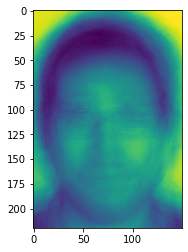

In [5]:
#1
training_list_data = readImageToNumpyData(training_list)
average_img = np.average(training_list_data, axis=0)
average_shaped_back = np.resize(average_img,(220, 150))
imgplot = plt.imshow(average_shaped_back)
imgplot

NormedArrayOfFaces = []
for img in training_list_data:
    NormedArrayOfFaces.append(np.subtract(img, average_img)) 
NormedArrayOfFaces = np.asarray(NormedArrayOfFaces)

#Formatierung des NormedArrayOfFaces
NewNormedArrayOfFaces = []
for array in NormedArrayOfFaces:
    NewNormedArrayOfFaces.append(array[0])
NewNormedArrayOfFaces = np.asarray(NewNormedArrayOfFaces)

NormedArrayOfFaces = NewNormedArrayOfFaces

## Berechnung der Eigenfaces

__Aufgaben:__

1. Implementieren Sie die Funktion _calculateEigenfaces(adjfaces,width,height)_. Dieser Funktion werden die normierten Bilder _NormedArrayOfFaces_ zusammen mit der Bildbreite und -höhe übergeben. Zurück liefert die Funktion ein Numpy-Array, dessen Zeilen die berechneten normierten Eigenfaces sind. Die Berechnung der Eigenfaces ist im Theorieteil Abschnitt [Bestimmung der Eigenfaces](#theoryEig) beschrieben. Für die Python-Implementierung können Sie folgende Hinweise berücksichtigen:
    * Berechnung der transponierten eines Numpy-Arrays $A$ mit der Numpy-Methode _transpose()_
    * Matrixmultiplikation zweier Numpy-Arrays $A$ und $B$ mit der Numpy-Funktion _dot()_
    * Berechnung der Eigenvektoren und Eigenvalues eines Numpy Arrays $A$ mit der Numpy-Funktion _linalg.eigh()_
    * Sortierung von Numpy-Arrays mit den Numpy-Funktionen _sort()_ und _argsort()_.
2. Aus dem von der Funktion _calculateEigenfaces(adjfaces,width,height)_ zurück gelieferten Array von Eigenfaces sind die $K$ relevantesten auszuwählen. Dieses reduzierte Array wird im Folgenden mit _Usub_ bezeichnet. Im Versuch kann $K=6$ eingestellt werden.
3. Zeigen Sie die $K=6$ wichtigsten Eigenfaces als Bilder mit der [matplotlib.pyplot_-Funktion _imshow()](http://matplotlib.org/1.3.0/users/image_tutorial.html) an.

## <span style="color:#900C3F">Dokumentation unserer Ergebnisse</span>

Für die Bestimmung der Eigenfaces wurden die gegebenen Hinweise befolgt. Zunächst wird eine transponierte Matrix *X* von dem zuvor berechneten Array *NormedArrayOfFaces* (hier: *X_t*) erstellt. Danach werden die beiden Matrizen *X_t* und *X* multipliziert, wobei es wichtig ist, dass *X_t* der erste Faktor ist. Aus dieser neuen Matrix *prod* werden dann Eigenvalues und Eigenvektoren berechnet. Diese Werte entsprechen allerdings noch nicht denen der gesuchten Matrix. Eben jene werden danach als *eigenfaces* berechnet. Das Array *eigenfaces* ist bereits sortiert und reduziert auf die k (hier:6) relevantesten Werte. 
Als letztes werden die K Eigenfaces angezeigt.

In [6]:
#1 & #3
def calculateEigenfaces(adjfaces, k):
    X_t = adjfaces
    X = np.transpose(adjfaces)
    prod = np.dot(X_t, X)
    eigenvalues, eigenvectors = LA.eigh(prod)
    eigenvectors_sorted = eigenvectors[np.argsort(eigenvalues)]
    relevant_eigenvectors = eigenvectors_sorted[:,-k:]
    eigenfaces = np.dot(X, relevant_eigenvectors)
    return eigenfaces

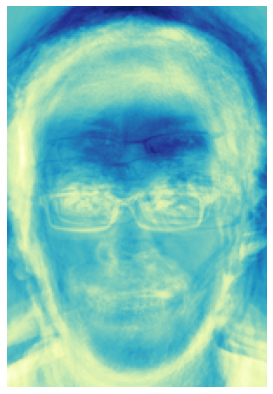

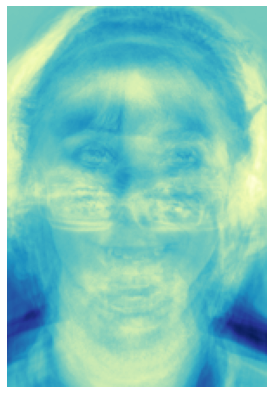

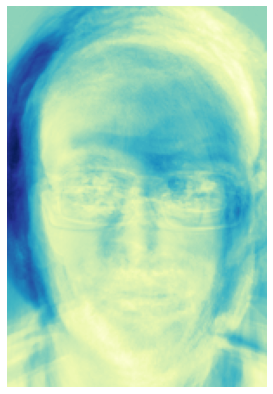

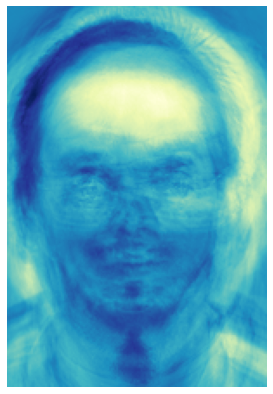

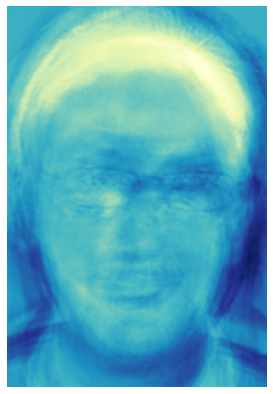

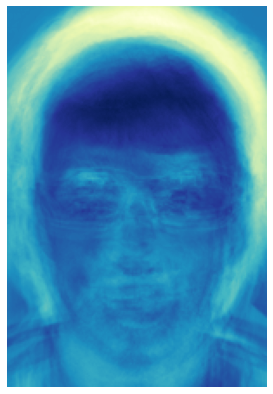

In [7]:
k = 6
#2
usub = calculateEigenfaces(NormedArrayOfFaces, k)
usubT = usub.T

for i in range(len(usubT)):
    plt.figure(figsize=(7,7))
    plt.imshow(np.reshape(usubT[i], (220, 150)), cmap="YlGnBu")
    plt.axis("off")
    plt.show()

## Transformation der normierten Trainingsbilder in den Eigenface Raum

__Aufgabe:__

Die im vorigen Schritt angelegten $K$ relevantesten Eigenfaces spannen den sogenannten _Eigenface-Raum_ auf. Für jedes der normierten Trainingsbilder, also für jede Zeile aus _NormedArrayOfFaces_, sind die Koordinaten im Eigenface-Raum entsprechend der Gleichung für [$\omega_{k,i}$](#theoryRec) definierten Transformation zu berechnen.

## <span style="color:#900C3F">Dokumentation unserer Ergebnisse</span>

Um den Eigenface Raum zu berechnen wird in der ersten *for-Schleife* über alle Bilder aus *NormedArrayOfFaces* iteriert und für jedes Bild werden K Koordinaten bestimmt. Dazu wird in einer zweiten *for-Schleife* die transponierte Matrix des Bildes einzelnd mit den Werten aus *usub* multipliziert und jeweils dem Array *zwres* hinzugefügt. Somit werden für jedes der M (hier:63) Bilder aus den Trainingsdaten jeweils K (hier: 6) Koordinaten berechnet. 
Das Array mit all diesen Werten wird zurückgegeben. 

In [8]:
def calculate_eigenface_raum(normed, usub):
    res = []
    for k in range(len(normed)):
        row = normed[k]
        zwres = []
        for i in range(len(usub)):
            phi = usub[i] 
            zwres.append(np.dot(row.T, phi.reshape(-1,1))[0])
        res.append(zwres)
    return res

In [9]:
eigenface_raum = calculate_eigenface_raum(NormedArrayOfFaces, usubT)
print(np.array(eigenface_raum).shape)
print(eigenface_raum)

(63, 6)
[[-50.93598, 399.6834, -1083.0455, 585.5562, -387.45673, 1358.9666], [-188.5986, 548.83325, -763.8875, 1305.8541, -425.8201, 3115.4944], [-742.147, 367.8069, -1076.8232, 731.63403, -372.89688, 3057.5952], [-369.86746, 398.45343, -1218.3289, 1410.5261, -503.75565, 3629.768], [-343.05722, 440.32245, -1357.7524, 1324.1776, -468.45245, 3218.8914], [-385.46387, 420.44534, -1256.7947, 1449.1082, -383.84277, 3410.9407], [-525.0848, -581.31415, -1689.9731, -1095.3877, -1509.8301, 1903.8024], [316.19653, -572.0623, -1519.9901, -1071.0477, -1277.2291, 694.5587], [-69.00751, -520.2168, -1888.2639, -1257.5082, -1331.6427, 1279.5934], [798.87384, 540.0956, -730.54395, 101.17476, 254.69356, 1419.8713], [780.0376, 566.0712, -718.0336, 89.72927, 236.71303, 1337.9438], [883.40265, 696.0645, -459.92032, 348.0117, -28.432533, 1358.3203], [551.8318, -504.22983, -96.67171, -1825.5063, 93.48579, -604.35986], [547.01025, -489.78003, 540.6991, -1576.4845, -78.50418, -188.20361], [547.9558, -242.41263,

## Erkennung

__Aufgaben:__

1. Wählen Sie ein Bild aus dem Verzeichnis _test_ aus. Das ausgewählte zu erkennende Bild ist als Numpy-Array darzustellen. Eine Normierung der Pixelwerte in den Bereich zwischen 0 und 1 ist durchzuführen (wie bereits oben beschrieben). Schließlich muss auch von diesem Bild das Durchschnittsbild aller Trainingsbilder abgezogen werden. Diese Prozessschritte entsprechen der oben beschriebenen Vorverarbeitung der Trainingsbilder. Das resultierende normierte und mittelwertfreie Bild wird im Folgenden mit _NormedTestFace_ bezeichnet.
3. Danach sind die Koordinaten des _NormedTestFace_ im Eigenface-Raum nach Gleichung [$\omega_{k}$](#theoryRec) zu berechnen und das in diesem Raum nächstliegende Trainingsbild zu bestimmen.

## <span style="color:#900C3F">Dokumentation unserer Ergebnisse</span>

1. Das ausgewählte Testbild wird der Funktion `readImageToNumpyData()` übergeben und somit genau wie die Trainingsbilder verarbeitet. Als *NormedTestFace* wird das normierte und mittelwertfreie Testbild bezeichnet.

2. Mithilfe der Funktion `calculate_training_picture_cords()` werden die Koordinaten des Testbildes im EigenfaceRaum nach der Gleichung [$\omega_{k}$](#theoryRec) berechnet. Die Funktion `find_nearest_picture()` bestimmt widerum das nächste Bild im Eigenraum unter Benutzung der Euklidischen Distanz. Dafür wird die Distanz vom Testbild zu jedem einzelnen Trainingsbild berechnet und in *distance_dict* gespeichert. Dieses Array wird dann sortiert und der kleinste Wert wird als *nearest_point* zurückgegeben.

In [10]:
#1
test_picture = ["FaceRecogBilder/test/1.png"]
test_picture_data = readImageToNumpyData(test_picture)
NormedTestFace = np.subtract(test_picture_data, average_img)[0]
print(NormedTestFace)

[[-0.00675988 -0.00222033 -0.00173539 ... -0.03348857 -0.02217653
  -0.04653916]]


In [11]:
#2
def calculate_training_picture_cords(test_picture, normed):
    res = []
    for k in range(len(normed)):
        row = normed[k]
        res.append(np.dot(row.T, test_picture))
    return res

In [12]:
NormedTestFaceCords = calculate_training_picture_cords(NormedTestFace[0], usubT)
print(NormedTestFaceCords)

[169.68776, 361.7835, -1369.047, 1071.5312, -388.84366, 1761.5715]


In [13]:
def find_nearest_picture(query_picture, eigenspace):
    distance_dict = dict()
    for i, point in enumerate(eigenspace):
        distance_dict[i] = distance.euclidean(query_picture, point)
    sorted_distance_dict = {k: v for k, v in sorted(distance_dict.items(), key=lambda item: item[1])}
    return eigenspace[[x for x in sorted_distance_dict.keys()][0]]

In [14]:
nearest_point = find_nearest_picture(NormedTestFaceCords, eigenface_raum)
print(nearest_point)

[-50.93598, 399.6834, -1083.0455, 585.5562, -387.45673, 1358.9666]


__Aufgaben:__
1. Führen Sie die implementierte Gesichtserkennung für alle Bilder im Verzeichnis _test_ aus. Zeigen Sie jeweils das Testbild, das zugehörige erkannte Bild und die Distanz zwischen beiden Bildern an.
2. Bestimmen Sie für die Werte $K=5,K=10$ und $K=15$ ($K$ ist die Anzahl der verwendeten Eigenfaces) die Rate falsch erkannter Bilder. 

## <span style="color:#900C3F">Dokumentation unserer Ergebnisse</span>

1. Jedes einzelne Testbild wird wie die Trainingsbilder zunächst normiert und mittelwertfrei umgewandelt. Daraufhin werden alle Testbilder in den Eigenfaceraum transformiert. Die Funktion `find_nearest_picture` bestimmt dann das jeweils erkannte Bild. 
In dem ersten Testdurchlauf mit K=6 Eigenfaces lautet das Ergebnis 18 richtige zu 3 falsch erkannten Bildern. Die Fehlerquote liegt dementsprechend bei 14,29%. 

2. Durch verändern der Anzahl der relevanten Eigenfaces, hat sich auch die Anzahl der falsch erkannten Bilder verändert. Mit K=5 wurden 4 Bilder falsch erkannt, dh. die Fehlerquote beträgt 19,05%. Sowohl bei K=10 und K=15 wurden jeweils 2 Bilder falsch erkannt. Hier beträgt die Fehlerquote 9,52%. 
Aus Interesse haben wir ebenfalls die Werte K=100, K=1000 und K=1 ausprobiert. Wenig überraschend wurden bei K=1 mit 17 falsch erkannten Bildern deutlich weniger erkannt. Bei beiden K=100 und K=1000 wurden, wie bei K=10 und K=15, 2 Bilder falsch erkannt. Auffällig ist, dass es sich bei den 2 falsch erkannten Bildern immer um dieselben beiden Bilder handelt, egal ob K=10 oder K=1000.

In [15]:
def get_distance(query_picture, eigenspace):
    distance_dict = dict()
    for i, point in enumerate(eigenspace):
        distance_dict[i] = distance.euclidean(point, query_picture)
    return {k: v for k, v in sorted(distance_dict.items(), key=lambda item: item[1])}

In [16]:
def return_picture_comparions(eigenface_raum_k, usub_k):
    test_list_data = readImageToNumpyData(test_list)
    NormedTestFaces = [np.subtract(x, average_img)[0] for x in test_list_data]
    NormedTestFacesCords = [calculate_training_picture_cords(x, usub_k) for x in NormedTestFaces]
    NearestPicturesToNormedTestFaces = [find_nearest_picture(x, eigenface_raum_k) for x in NormedTestFacesCords]

    test_list_images = [mplimg.imread(x) for x in test_list]
    training_list_images = [mplimg.imread(x) for x in training_list]

    #Bestimme Indizes von KoordinatenPunkte
    NearestPicturesToNormedTestFacesIndices = []
    for cords in NearestPicturesToNormedTestFaces:
        NearestPicturesToNormedTestFacesIndices.append(eigenface_raum_k.index(cords))
    
    j = 0
    for i in NearestPicturesToNormedTestFacesIndices:
        fig, ax = plt.subplots(1, 2)
        print("Testbild: " + str(j))
        ax[0].imshow(test_list_images[j])
        ax[0].axis('off')
        print("Trainingsbild: " + str(i))
        ax[1].imshow(training_list_images[i])
        ax[1].axis('off')
        dist = get_distance(NormedTestFacesCords[j], eigenface_raum_k)
        dist_keys = [x for x in dist.keys()]
        print("Distanz: " + str(dist.get(dist_keys[0])))
        j += 1
        plt.show()

Testbild: 0
Trainingsbild: 0
Distanz: 836.65234375


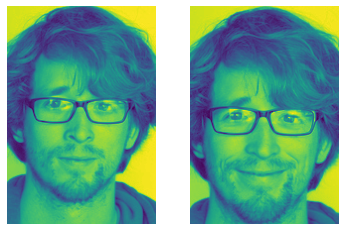

Testbild: 1
Trainingsbild: 0
Distanz: 728.1294555664062


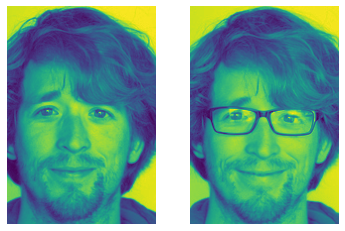

Testbild: 2
Trainingsbild: 8
Distanz: 750.1948852539062


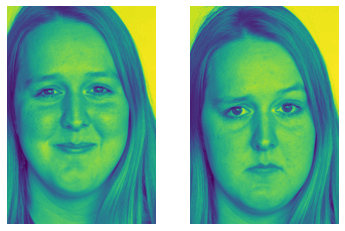

Testbild: 3
Trainingsbild: 9
Distanz: 249.2132110595703


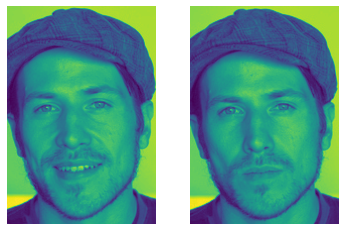

Testbild: 4
Trainingsbild: 14
Distanz: 1230.3079833984375


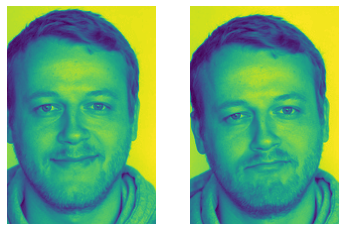

Testbild: 5
Trainingsbild: 17
Distanz: 490.9104309082031


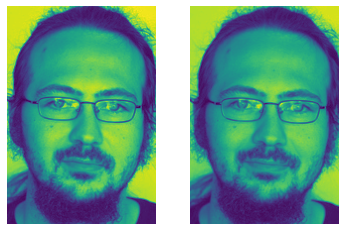

Testbild: 6
Trainingsbild: 20
Distanz: 1113.08837890625


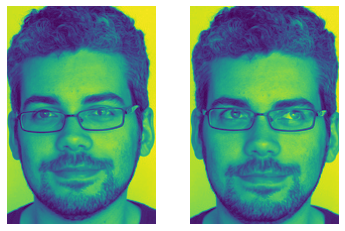

Testbild: 7
Trainingsbild: 21
Distanz: 752.3316040039062


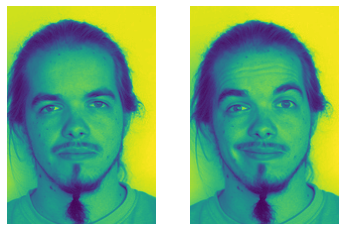

Testbild: 8
Trainingsbild: 24
Distanz: 1399.8193359375


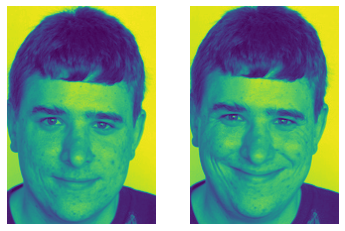

Testbild: 9
Trainingsbild: 27
Distanz: 744.5772094726562


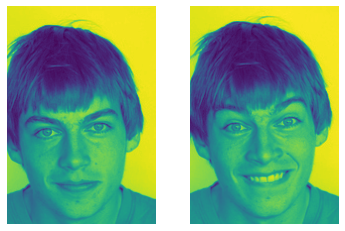

Testbild: 10
Trainingsbild: 30
Distanz: 1198.314208984375


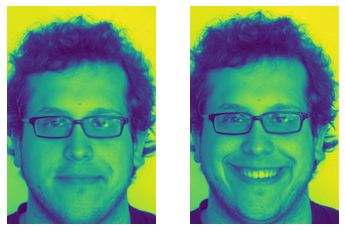

Testbild: 11
Trainingsbild: 35
Distanz: 535.9852905273438


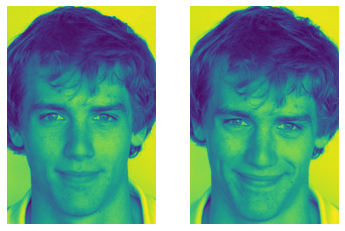

Testbild: 12
Trainingsbild: 38
Distanz: 1496.5391845703125


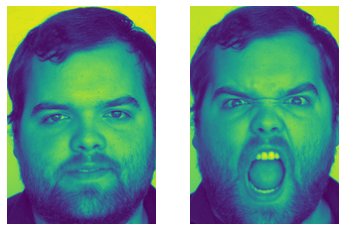

Testbild: 13
Trainingsbild: 39
Distanz: 711.8877563476562


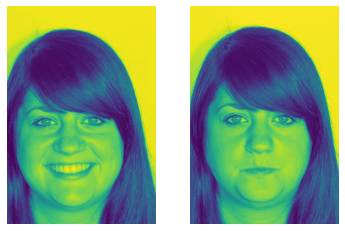

Testbild: 14
Trainingsbild: 44
Distanz: 1070.8414306640625


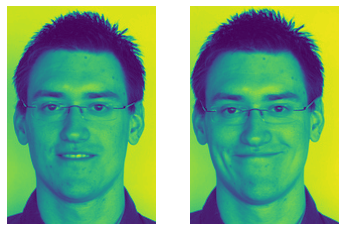

Testbild: 15
Trainingsbild: 47
Distanz: 1437.1973876953125


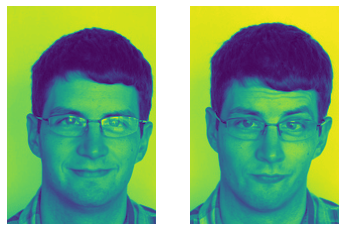

Testbild: 16
Trainingsbild: 41
Distanz: 1663.400634765625


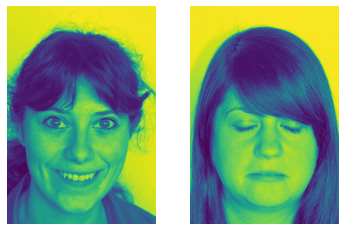

Testbild: 17
Trainingsbild: 51
Distanz: 356.8409423828125


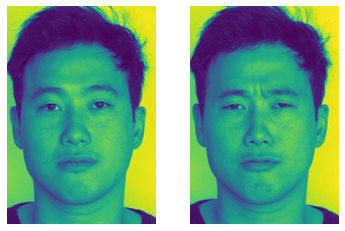

Testbild: 18
Trainingsbild: 12
Distanz: 1470.4322509765625


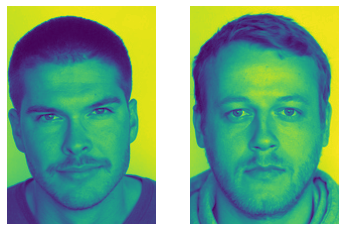

Testbild: 19
Trainingsbild: 58
Distanz: 287.48126220703125


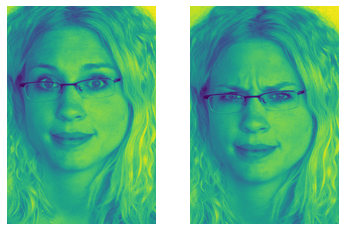

Testbild: 20
Trainingsbild: 54
Distanz: 942.6548461914062


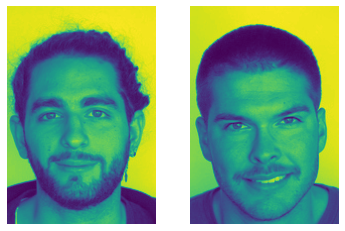

In [17]:
#1 
return_picture_comparions(eigenface_raum, usubT)

Testbild: 0
Trainingsbild: 9
Distanz: 625.8515014648438


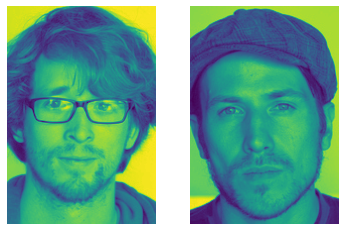

Testbild: 1
Trainingsbild: 0
Distanz: 693.9003295898438


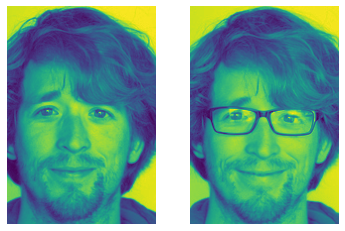

Testbild: 2
Trainingsbild: 7
Distanz: 481.3336486816406


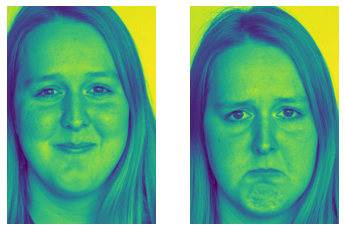

Testbild: 3
Trainingsbild: 9
Distanz: 220.62548828125


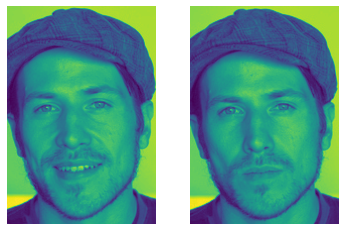

Testbild: 4
Trainingsbild: 14
Distanz: 1061.1805419921875


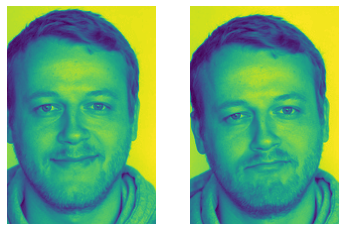

Testbild: 5
Trainingsbild: 17
Distanz: 490.80718994140625


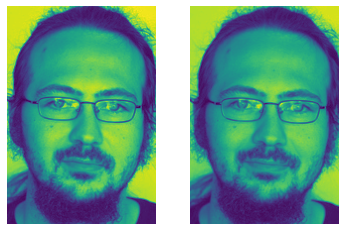

Testbild: 6
Trainingsbild: 20
Distanz: 1097.427001953125


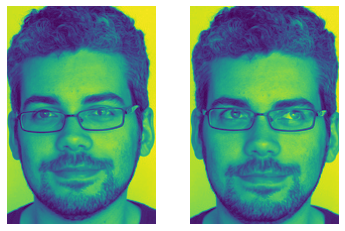

Testbild: 7
Trainingsbild: 21
Distanz: 750.0546875


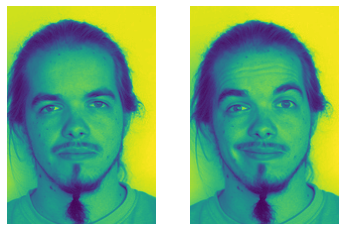

Testbild: 8
Trainingsbild: 24
Distanz: 1395.325439453125


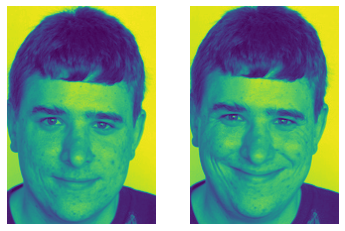

Testbild: 9
Trainingsbild: 27
Distanz: 741.8219604492188


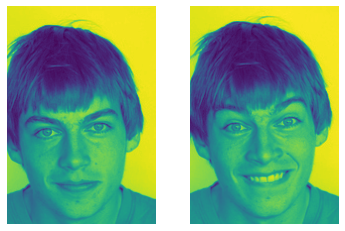

Testbild: 10
Trainingsbild: 30
Distanz: 1125.4248046875


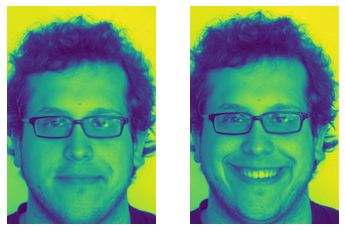

Testbild: 11
Trainingsbild: 35
Distanz: 394.2290344238281


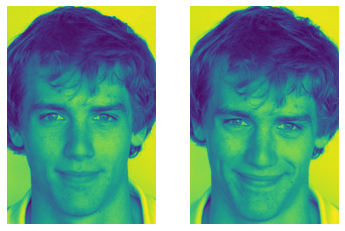

Testbild: 12
Trainingsbild: 36
Distanz: 1376.6622314453125


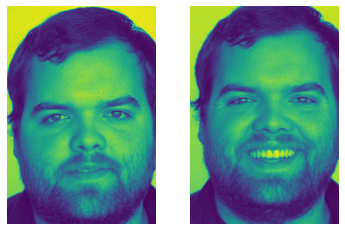

Testbild: 13
Trainingsbild: 39
Distanz: 698.4324951171875


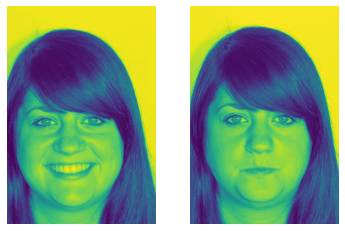

Testbild: 14
Trainingsbild: 44
Distanz: 1061.798095703125


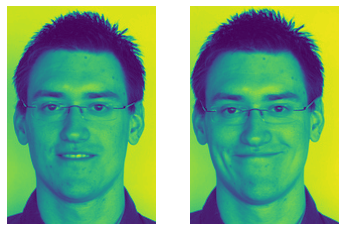

Testbild: 15
Trainingsbild: 47
Distanz: 1432.06640625


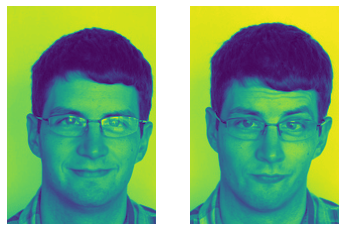

Testbild: 16
Trainingsbild: 40
Distanz: 1602.093994140625


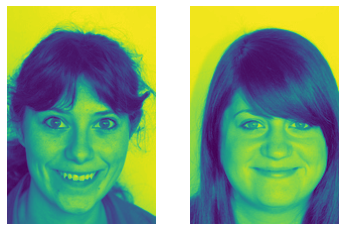

Testbild: 17
Trainingsbild: 51
Distanz: 343.3199157714844


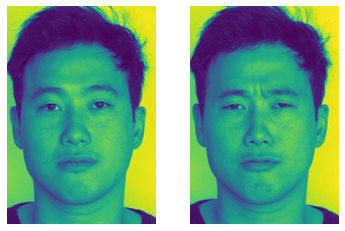

Testbild: 18
Trainingsbild: 12
Distanz: 1413.0501708984375


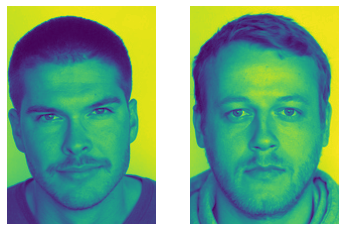

Testbild: 19
Trainingsbild: 58
Distanz: 199.3705291748047


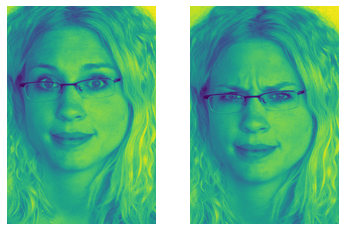

Testbild: 20
Trainingsbild: 54
Distanz: 920.5103149414062


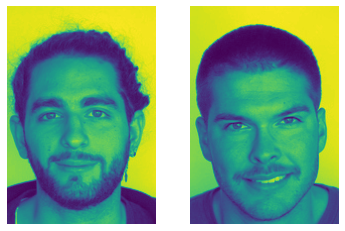

4 falsche Bilder wurden erkannt


In [18]:
#2
#k = 5

usub_5 = calculateEigenfaces(NormedArrayOfFaces, 5)
usub_5_T = usub_5.T
eigenface_raum_5 = calculate_eigenface_raum(NormedArrayOfFaces, usub_5_T)

return_picture_comparions(eigenface_raum_5, usub_5_T)
print("4 falsche Bilder wurden erkannt")

Testbild: 0
Trainingsbild: 0
Distanz: 1132.5283203125


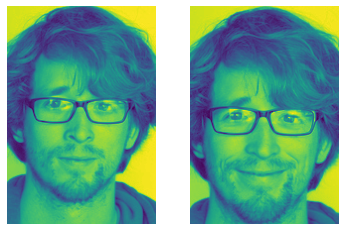

Testbild: 1
Trainingsbild: 0
Distanz: 803.2957763671875


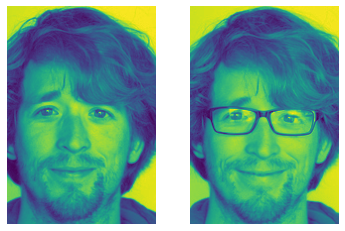

Testbild: 2
Trainingsbild: 8
Distanz: 888.8345336914062


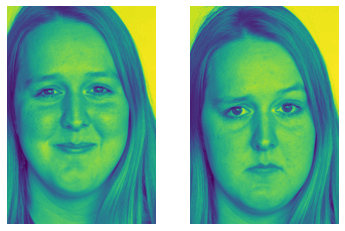

Testbild: 3
Trainingsbild: 9
Distanz: 265.69647216796875


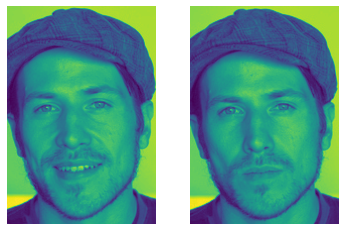

Testbild: 4
Trainingsbild: 14
Distanz: 1313.630126953125


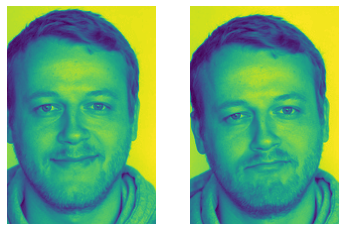

Testbild: 5
Trainingsbild: 17
Distanz: 534.7611694335938


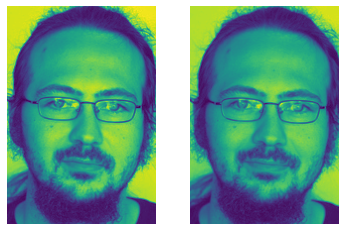

Testbild: 6
Trainingsbild: 20
Distanz: 1337.7882080078125


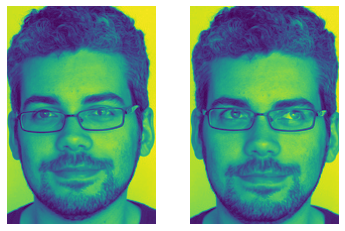

Testbild: 7
Trainingsbild: 21
Distanz: 765.8749389648438


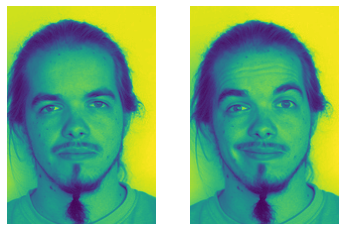

Testbild: 8
Trainingsbild: 24
Distanz: 1452.475830078125


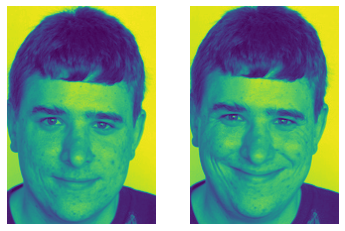

Testbild: 9
Trainingsbild: 27
Distanz: 775.1741943359375


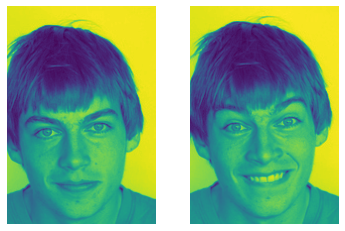

Testbild: 10
Trainingsbild: 30
Distanz: 1243.5184326171875


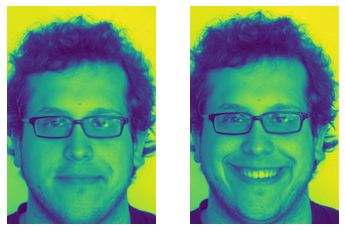

Testbild: 11
Trainingsbild: 35
Distanz: 591.4951171875


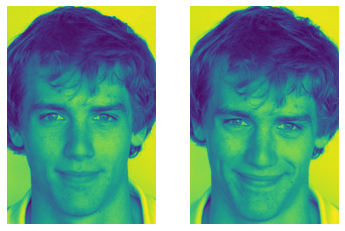

Testbild: 12
Trainingsbild: 38
Distanz: 1547.6253662109375


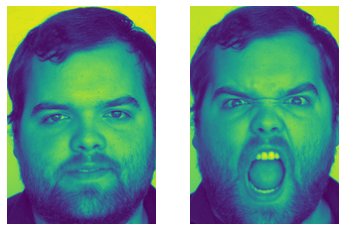

Testbild: 13
Trainingsbild: 39
Distanz: 785.7941284179688


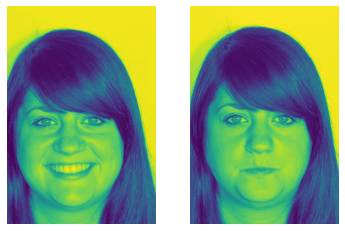

Testbild: 14
Trainingsbild: 44
Distanz: 1122.71728515625


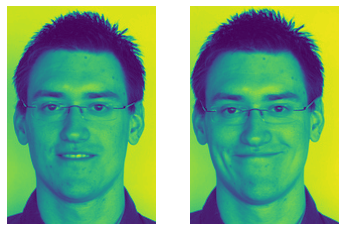

Testbild: 15
Trainingsbild: 47
Distanz: 1447.33154296875


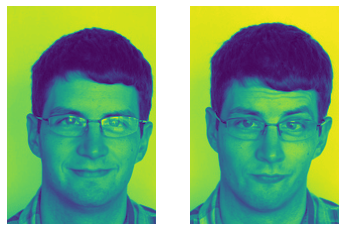

Testbild: 16
Trainingsbild: 39
Distanz: 1947.8701171875


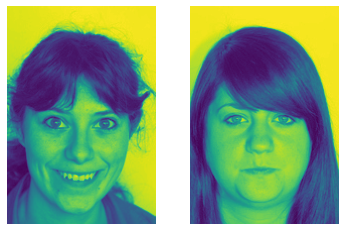

Testbild: 17
Trainingsbild: 51
Distanz: 381.8723449707031


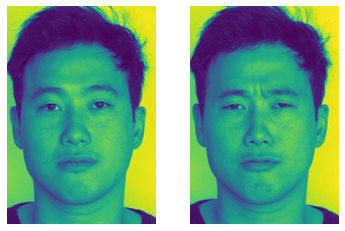

Testbild: 18
Trainingsbild: 14
Distanz: 1908.884521484375


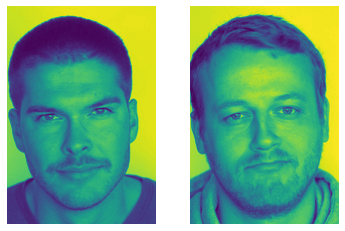

Testbild: 19
Trainingsbild: 58
Distanz: 341.66314697265625


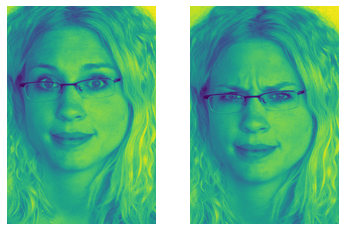

Testbild: 20
Trainingsbild: 61
Distanz: 1164.93017578125


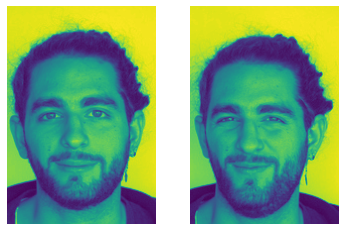

2 falsche Bilder wurden erkannt


In [19]:
#k = 10

usub_10 = calculateEigenfaces(NormedArrayOfFaces, 10)
usub_10_T = usub_10.T
eigenface_raum_10 = calculate_eigenface_raum(NormedArrayOfFaces, usub_10_T)

return_picture_comparions(eigenface_raum_10, usub_10_T)
print("2 falsche Bilder wurden erkannt")

Testbild: 0
Trainingsbild: 0
Distanz: 1181.429443359375


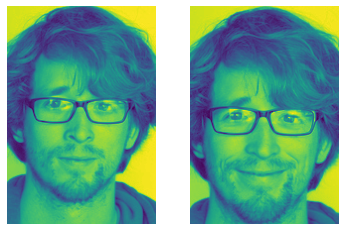

Testbild: 1
Trainingsbild: 0
Distanz: 890.6482543945312


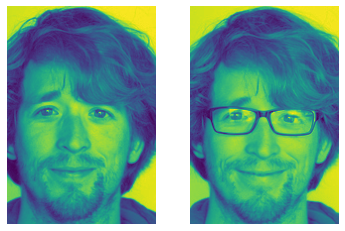

Testbild: 2
Trainingsbild: 6
Distanz: 953.2650146484375


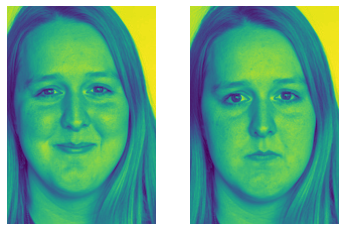

Testbild: 3
Trainingsbild: 9
Distanz: 273.9659423828125


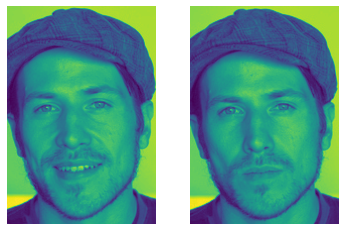

Testbild: 4
Trainingsbild: 14
Distanz: 1388.2540283203125


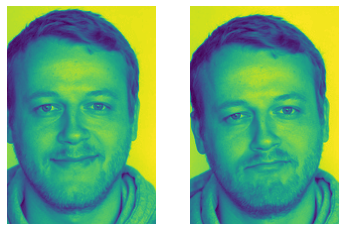

Testbild: 5
Trainingsbild: 17
Distanz: 554.3134765625


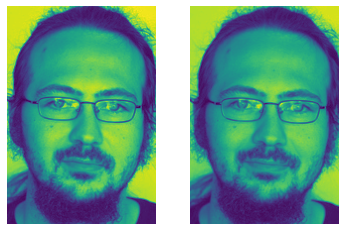

Testbild: 6
Trainingsbild: 20
Distanz: 1445.7979736328125


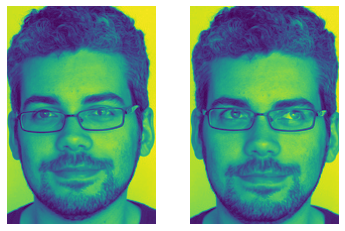

Testbild: 7
Trainingsbild: 21
Distanz: 786.4328002929688


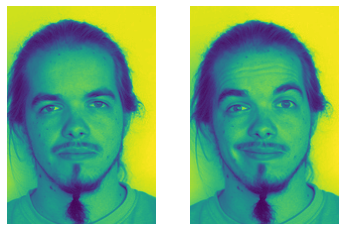

Testbild: 8
Trainingsbild: 24
Distanz: 1461.009765625


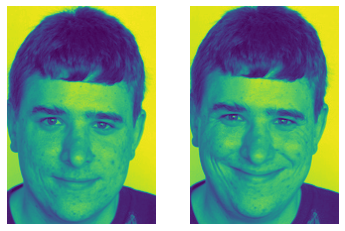

Testbild: 9
Trainingsbild: 27
Distanz: 825.9088745117188


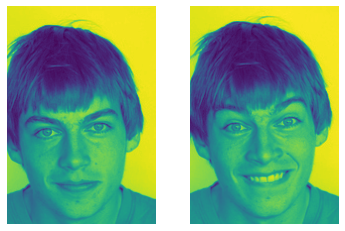

Testbild: 10
Trainingsbild: 30
Distanz: 1260.1519775390625


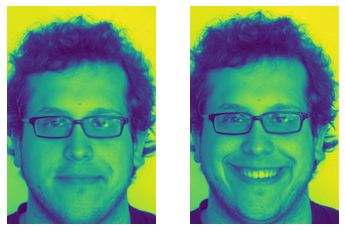

Testbild: 11
Trainingsbild: 35
Distanz: 616.8916015625


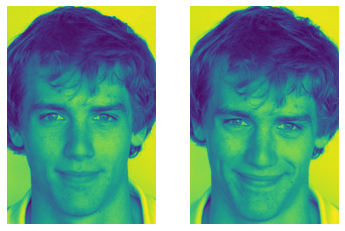

Testbild: 12
Trainingsbild: 38
Distanz: 1582.181640625


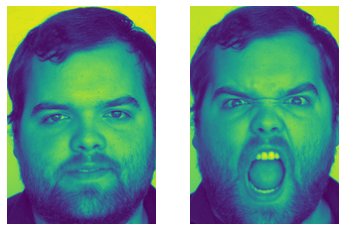

Testbild: 13
Trainingsbild: 39
Distanz: 834.0249633789062


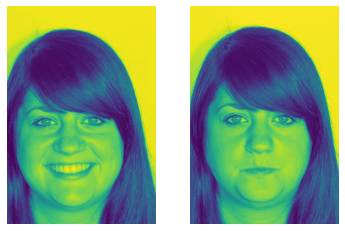

Testbild: 14
Trainingsbild: 44
Distanz: 1159.388427734375


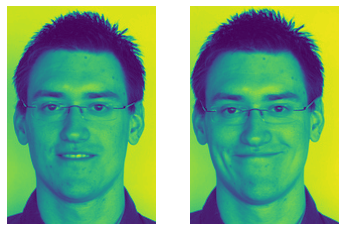

Testbild: 15
Trainingsbild: 47
Distanz: 1469.6673583984375


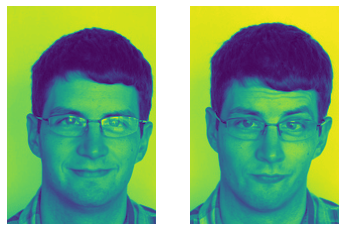

Testbild: 16
Trainingsbild: 39
Distanz: 2002.64306640625


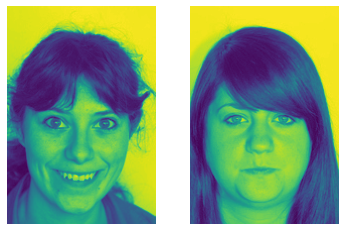

Testbild: 17
Trainingsbild: 51
Distanz: 390.7464599609375


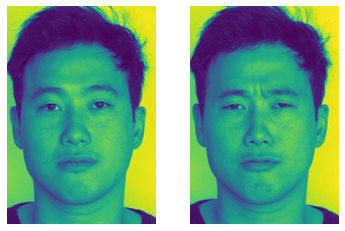

Testbild: 18
Trainingsbild: 14
Distanz: 1924.501708984375


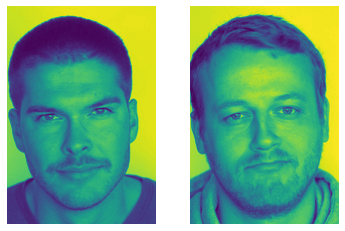

Testbild: 19
Trainingsbild: 58
Distanz: 364.7337951660156


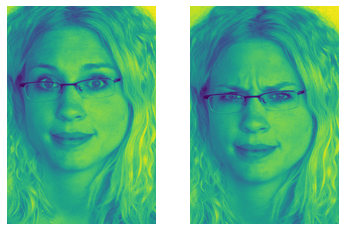

Testbild: 20
Trainingsbild: 61
Distanz: 1224.1695556640625


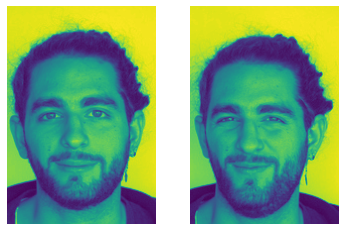

2 falsche Bilder wurden erkannt


In [20]:
#k = 15

usub_15 = calculateEigenfaces(NormedArrayOfFaces, 15)
usub_15_T = usub_15.T
eigenface_raum_15 = calculate_eigenface_raum(NormedArrayOfFaces, usub_15_T)

return_picture_comparions(eigenface_raum_15, usub_15_T)
print("2 falsche Bilder wurden erkannt")

## <span style="color:#900C3F">Fazit</span> 
    
Dieser Versuch war wirklich sehr interessant und der unter anderem meist erwarteste. Von der Theorie her, war er definitiv der bisher anspruchsvollste. Im Allgemeinen waren wir aber überrascht darüber wie schnell und einfach man doch eine Gesichtserkennung implementieren kann, die zumindest auf den Test/Trainingsdaten relativ gut funktioniert. Am Anfang hatten wir eine hohe Fehlerquote bei der Erkennung durch mehrere kleinere Logikfehler im vorherigen Code. 
Generell haben wir bei diesem Versuch neben dem Prinzip der Gesichtserkennung noch gelernt, wie man mit Bildern in Python umgeht und wie man diese in Daten umwandeln kann. Darüber hinaus mussten wir uns auch nochmal genauer mit Matrizen auseinandersetzen.